In [1]:
import numpy as np
import cv2
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans
import skimage.io
import matplotlib.pyplot as plt

image = cv2.imread('eleph.jpg')
(h1, w1) = image.shape[:2]

image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

image = image.reshape((image.shape[0] * image.shape[1], 3))

clt = KMeans(n_clusters = 30)

labels = clt.fit_predict(image)
quant = clt.cluster_centers_.astype("uint8")[labels]

#reshape the feature vectors to images
quant = quant.reshape((h1, w1, 3))
image = image.reshape((h1, w1, 3))

# convert from L*a*b* to RGB
quant = cv2.cvtColor(quant, cv2.COLOR_LAB2BGR)
image = cv2.cvtColor(image, cv2.COLOR_LAB2BGR)

image0=cv2.imwrite('eleph30.jpg', quant)

image0=cv2.imread('eleph30.jpg')
cv2.waitKey(0)
cv2.destroyAllWindows()

(<matplotlib.axes._subplots.AxesSubplot at 0x7f7700f6e950>,
 Text(0.5, 1.0, ' image avec cluster=30'))

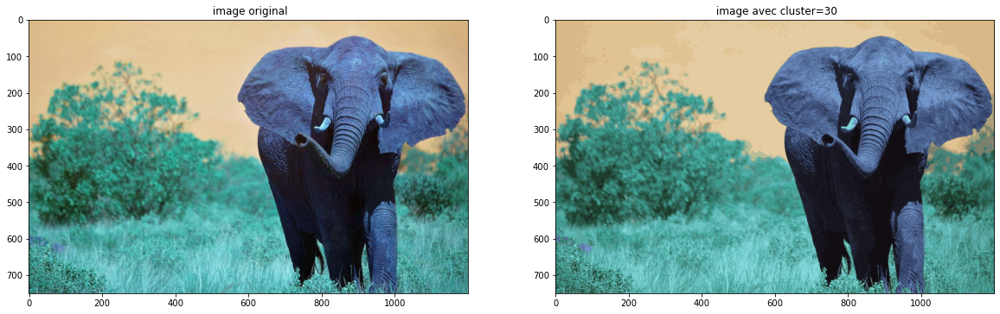

In [2]:
plt.figure(figsize=(20,24))
plt.subplot(121),plt.imshow(image),plt.title(' image original')

plt.subplot(122),plt.imshow(image0),plt.title(' image avec cluster=30')


# Apply the different types of noise¶



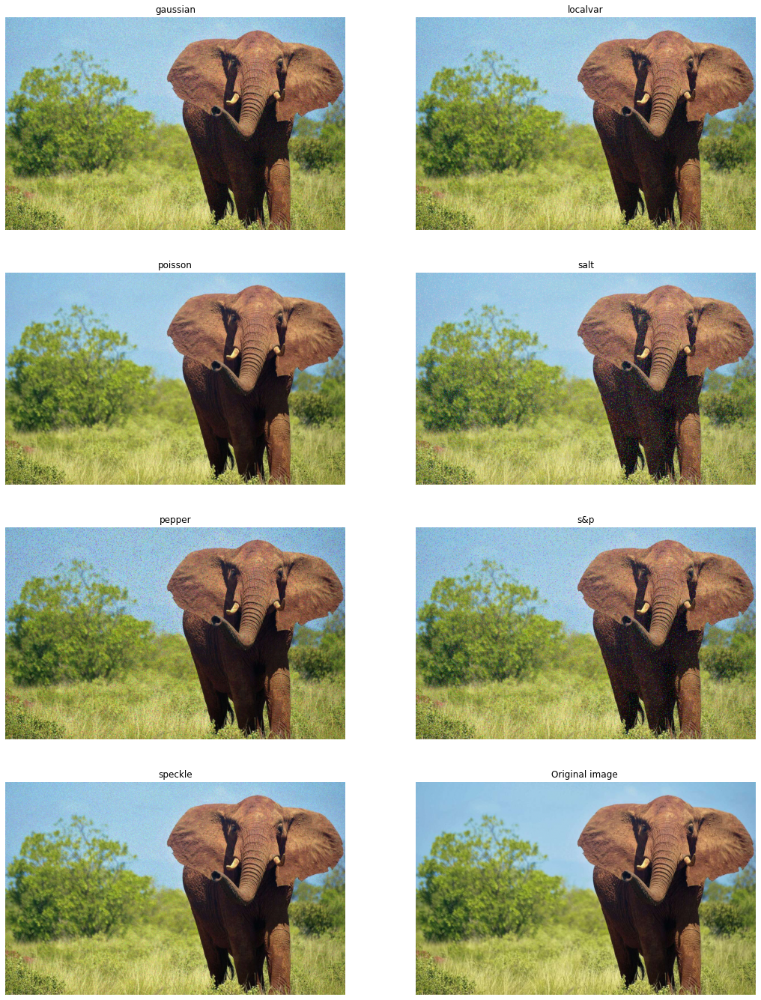

In [3]:
import skimage
import matplotlib.pyplot as plt
img_path="eleph.jpg"
img = skimage.io.imread(img_path)/255.0

def plotnoise(img, mode, r, c, i):
    plt.subplot(r,c,i)
    if mode is not None:
        gimg = skimage.util.random_noise(img, mode=mode)
        plt.imshow(gimg)
    else:
        plt.imshow(img)
    plt.title(mode)
    plt.axis("off")

plt.figure(figsize=(18,24))
r=4
c=2
plotnoise(img, "gaussian", r,c,1)
plotnoise(img, "localvar", r,c,2)
plotnoise(img, "poisson", r,c,3)
plotnoise(img, "salt", r,c,4)
plotnoise(img, "pepper", r,c,5)
plotnoise(img, "s&p", r,c,6)
plotnoise(img, "speckle", r,c,7)
plotnoise(img, None, r,c,8),plt.title('Original image ')
plt.show()

# Gaussian noise added over image¶


In [4]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

img = cv2.imread("eleph.jpg")[...,::-1]/255.0
noise =  np.random.normal(loc=0, scale=1, size=img.shape)

# noise overlaid over image
noisy = np.clip((img + noise*0.2),0,1)
noisy2 = np.clip((img + noise*0.4),0,1)

# noise multiplied by image:
# whites can go to black but blacks cannot go to white
noisy2mul = np.clip((img*(1 + noise*0.2)),0,1)
noisy4mul = np.clip((img*(1 + noise*0.4)),0,1)

# noise multiplied by bottom and top half images,
# whites stay white blacks black, noise is added to center
img2 = img*2
n2 = np.clip(np.where(img2 <= 1, (img2*(1 + noise*0.2)), (1-img2+1)*(1 + noise*0.2)*-1 + 2)/2, 0,1)
n4 = np.clip(np.where(img2 <= 1, (img2*(1 + noise*0.4)), (1-img2+1)*(1 + noise*0.4)*-1 + 2)/2, 0,1)


# norm noise for viz only
noise2 = (noise - noise.min())/(noise.max()-noise.min())


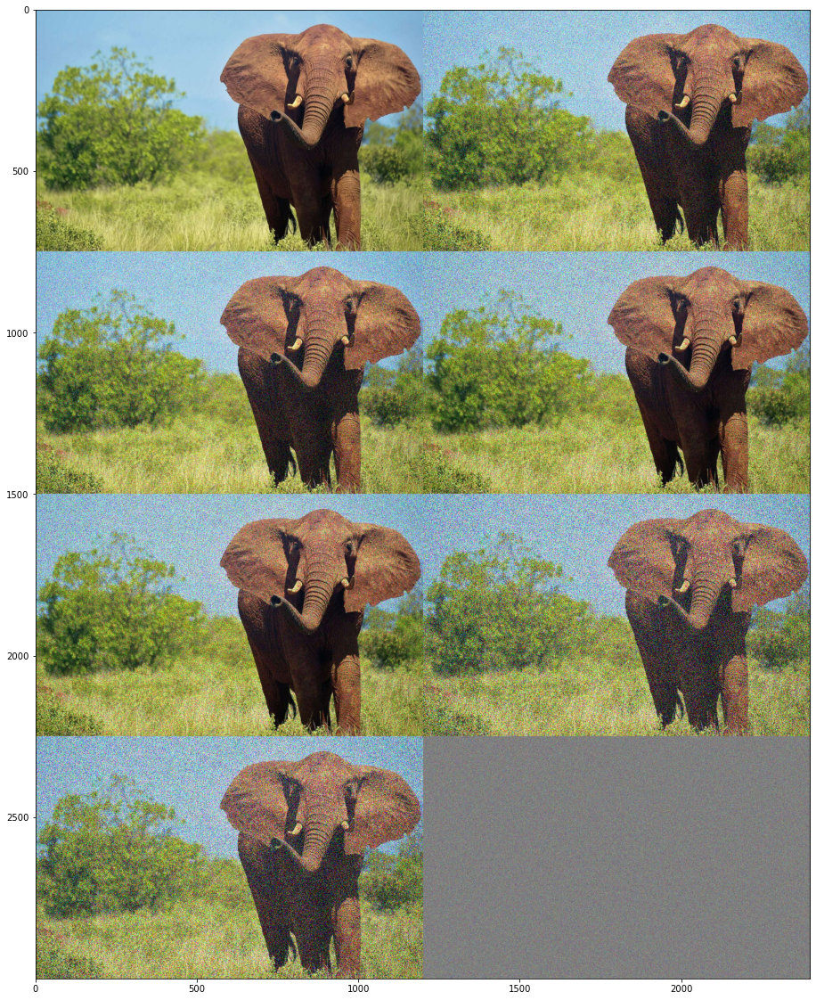

In [11]:

plt.figure(figsize=(20,20))
plt.imshow(np.vstack((np.hstack((img, noisy)),np.hstack((noisy, noisy4mul)),np.hstack((noisy4mul, noisy2)),np.hstack((noisy2, noise2)))))
plt.show()

In [ ]:
#On applique un bruit gaussien à un image et à chaque fois on applique une autre fois un bruit gausien jusqu'à 
#que l'image se disparu


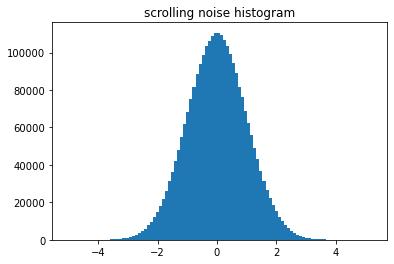

In [10]:
plt.hist(noise.ravel(), bins=100)
plt.title('scrolling noise histogram')
plt.show()

# Remove the Gaussian noise from a color image using the Non-local Means Denoising algorithm : 1st method

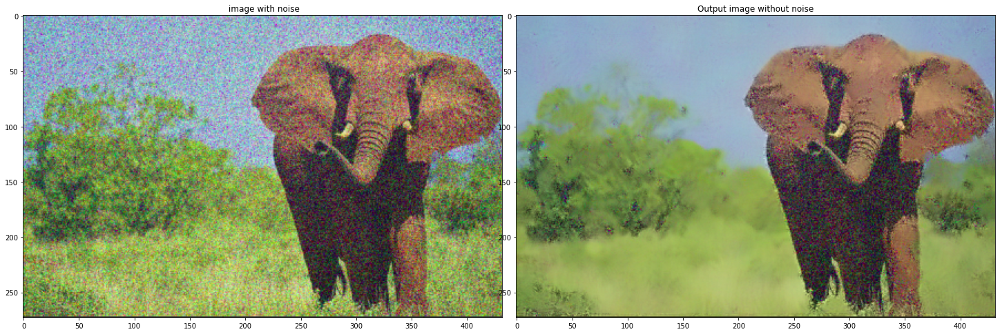

In [2]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

imgbruit = cv2.imread('elephbruit.png')
b,g,r = cv2.split(imgbruit)           # get b,g,r
rgb_img = cv2.merge([r,g,b])     # switch it to rgb

# Denoising
dst = cv2.fastNlMeansDenoisingColored(imgbruit,None,10,10,7,21)

b,g,r = cv2.split(dst)           # get b,g,r
rgb_dst = cv2.merge([r,g,b])     # switch it to rgb

#plt.figure(figsize=(18,24))
fig, axs = plt.subplots(1, 2, figsize=(20, 20), constrained_layout=True)

plt.subplot(121),plt.imshow(rgb_img),plt.title(' image with noise')

plt.subplot(122),plt.imshow(rgb_dst),plt.title('Output image without noise')
plt.show()

In [ ]:
# Après l'application de filtre , on remarque que le bruit est bien éliminer de l'image mais pas totalement
#On applique une autre fois le filtre pour éliminer de plus le bruit 

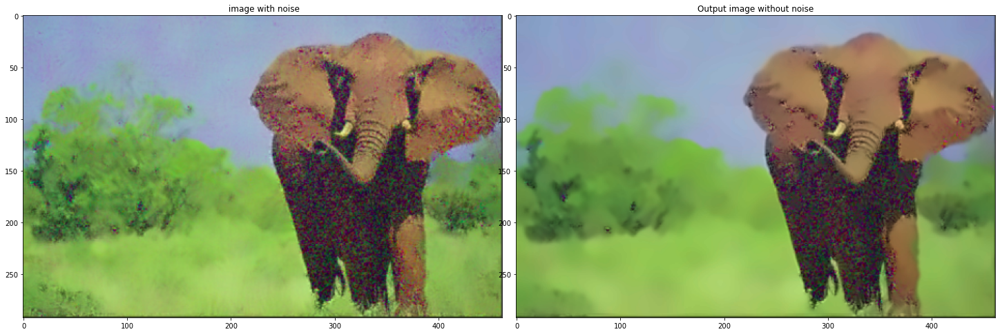

In [3]:
imgbruit = cv2.imread('elephbruit2.png')
b,g,r = cv2.split(imgbruit)           # get b,g,r
rgb_img = cv2.merge([r,g,b])     # switch it to rgb

# Denoising
dst = cv2.fastNlMeansDenoisingColored(imgbruit,None,10,10,7,21)

b,g,r = cv2.split(dst)           # get b,g,r
rgb_dst = cv2.merge([r,g,b])     # switch it to rgb

#plt.figure(figsize=(18,24))
fig, axs = plt.subplots(1, 2, figsize=(20, 20), constrained_layout=True)

plt.subplot(121),plt.imshow(rgb_img),plt.title(' image with noise')

plt.subplot(122),plt.imshow(rgb_dst),plt.title('Output image without noise')
plt.show()

In [ ]:
#voilà le bruit est bien éliminer

# De-noising algorithms : 2nd method¶


In [15]:
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

In [16]:
def denoise(img, weight=0.1, eps=1e-3, num_iter_max=200):
    
    u = np.zeros_like(img)
    px = np.zeros_like(img)
    py = np.zeros_like(img)
    
    nm = np.prod(img.shape[:2])
    tau = 0.125
    
    i = 0
    while i < num_iter_max:
        u_old = u
        
        # x and y components of u's gradient
        ux = np.roll(u, -1, axis=1) - u
        uy = np.roll(u, -1, axis=0) - u
        
         # update the dual variable
        px_new = px + (tau / weight) * ux
        py_new = py + (tau / weight) * uy
        norm_new = np.maximum(1, np.sqrt(px_new **2 + py_new ** 2))
        px = px_new / norm_new
        py = py_new / norm_new

        # calculate divergence
        rx = np.roll(px, 1, axis=1)
        ry = np.roll(py, 1, axis=0)
        div_p = (px - rx) + (py - ry)
        
        # update image
        u = img + weight * div_p
        
        # calculate error
        error = np.linalg.norm(u - u_old) / np.sqrt(nm)
        
        if i == 0:
            err_init = error
            err_prev = error
        else:
            # break if error small enough
            if np.abs(err_prev - error) < eps * err_init:
                break
            else:
                e_prev = error
                
        # don't forget to update iterator
        i += 1

    return u

(<matplotlib.axes._subplots.AxesSubplot at 0x7f767c430ad0>,
 Text(0.5, 1.0, 'denoising with small weight'))

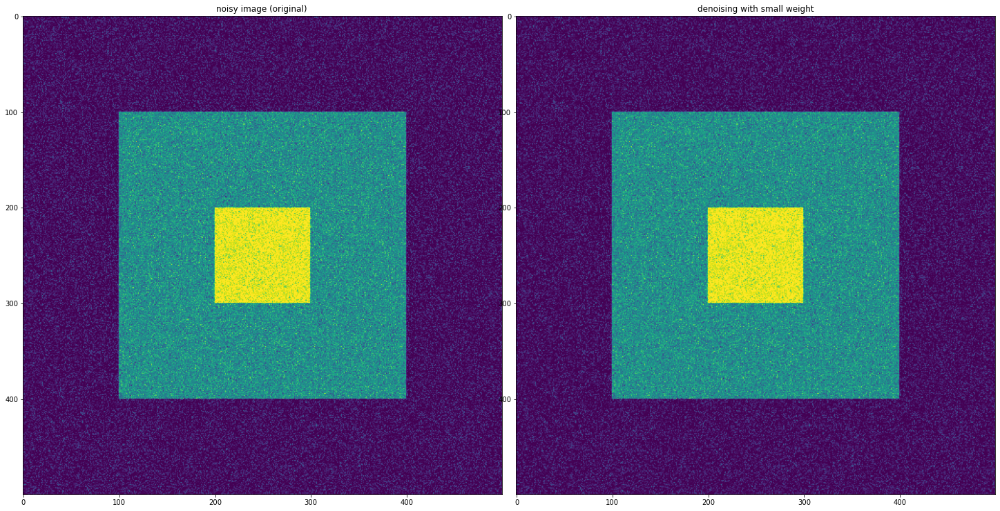

In [19]:
# notre propre image 
#img_path="../input/dataset/Segmentation/eleph7.jpg"
#img = skimage.io.imread(img_path)/255.0


#############################################################################################
#génaration d'image automatique 
img = np.zeros((500,500))
img[100:400,100:400] = 128
img[200:300,200:300] = 255
img = img + 30*np.random.standard_normal((500,500))
##########################################################################################
img = np.clip(img, 0, 255)

fig, axs = plt.subplots(1,4, figsize=(20, 20), constrained_layout=True)
plt.subplot(121),plt.imshow(img, cmap='viridis'),plt.title('noisy image (original) ')
plt.subplot(122),plt.imshow(denoise(img, weight=1), cmap='viridis'),plt.title('denoising with small weight')

(<matplotlib.axes._subplots.AxesSubplot at 0x7f767c1f9750>,
 Text(0.5, 1.0, 'denoising with strong weight'))

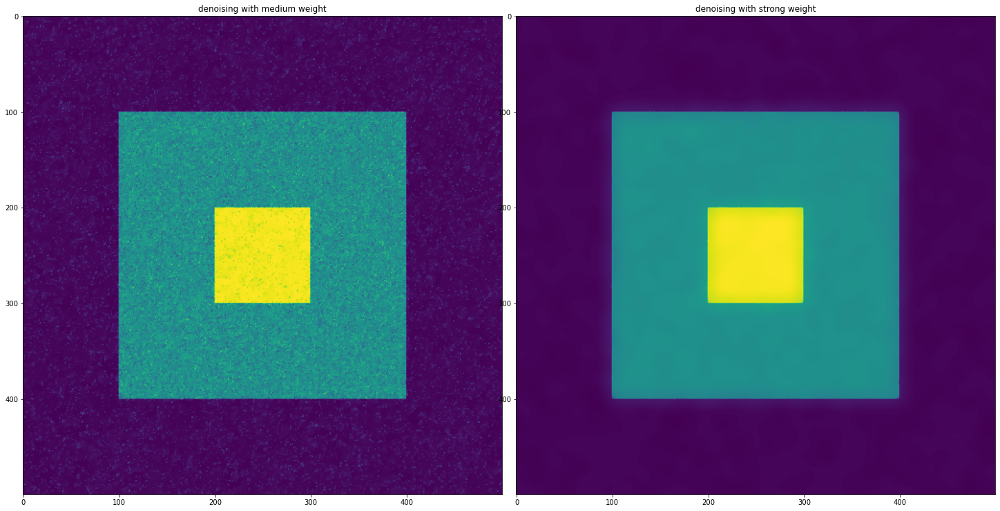

In [20]:
fig, axs = plt.subplots(1,4, figsize=(20, 20), constrained_layout=True)
plt.subplot(121),plt.imshow(denoise(img, weight=10), cmap='viridis'),plt.title('denoising with medium weight')
plt.subplot(122),plt.imshow(denoise(img, weight=100), cmap='viridis'),plt.title('denoising with strong weight')